# From Data to a Prediction: How Machines "Learn"

*An introduction to machine learning — no calculus required.*

In this lesson we will take a small pile of measurements and teach a computer to
make predictions from them. Along the way we will meet three ideas that show up
in **every** machine learning system, from spam filters to chatbots:

1. **A model** — a flexible rule with a few knobs we can turn.
2. **A loss** — a single number that scores how wrong the model currently is.
3. **A search** — a way of turning the knobs to make the loss as small as possible.

We will do the search the slow, obvious way: by trying lots of knob settings and
keeping the best one. In the **next** lesson we replace that with a much smarter
method called *gradient descent* — the engine inside real neural networks.

## 1. What does "learning" mean?

Two famous descriptions, about 40 years apart:

> "A computer program is said to **learn** from experience *E* with respect to
> some task *T* and some performance measure *P*, if its performance on *T*, as
> measured by *P*, improves with experience *E*."
>
> — Tom Mitchell, Carnegie Mellon University, 1998

> "[Machine learning is the] field of study that gives computers the ability to
> learn without being explicitly programmed."
>
> — Arthur Samuel, 1959

The key shift is this: instead of a human writing down the exact rule
("if the email contains *'free money'*, mark it as spam"), we let the computer
**find the rule itself** by looking at examples.

### A familiar example: the spam filter

Your spam filter is a machine learning program. Given examples of spam emails
(flagged by users) and examples of regular emails (nonspam, also called "ham"),
it learns to flag spam on its own.

Some vocabulary we will reuse for the rest of the course:

| Term | Meaning | In the spam example |
|---|---|---|
| **Training set** | the examples the system learns from | the emails users already sorted |
| **Training instance / sample** | one single example | one email |
| **Model** | the part that learns and makes predictions | the spam classifier |
| **Task (T)** | what we want to do | flag spam in new emails |
| **Experience (E)** | the data we learn from | the labelled training emails |
| **Performance measure (P)** | how we score the model | the fraction of emails classified correctly |

In *this* lesson the task is different — and simpler. Instead of sorting emails
into two bins, we will **predict a number**.

## 2. Our task: predict one number from another

Suppose a class grows 13 bean-sprout seedlings for a science fair. Each seedling
gets a different amount of water per week, and after a month the students measure
how tall each one grew.

- **Input `x`** — litres of water per week
- **Output `y`** — centimetres of growth that month

Here is the data they collected. (The numbers are made up, but the shape is
realistic: more water helps... up to a point.)

Our **task T** is: *given a new watering amount, predict how much a seedling
will grow.* The 13 measurements are our **experience E** — the training set.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# A couple of settings so every plot in this notebook looks consistent
plt.rcParams["figure.figsize"] = (7, 4.5)
plt.rcParams["axes.grid"] = True
plt.rcParams["grid.alpha"] = 0.3

In [2]:
# Our training data: 13 seedlings
# x = litres of water per week, y = centimetres of growth
x = np.array([0.03, 0.19, 0.34, 0.46, 0.65, 0.78, 0.81, 1.08, 1.18, 1.39, 1.60, 1.65, 1.90])
y = np.array([0.67, 0.85, 1.05, 1.08, 1.20, 1.40, 1.50, 1.30, 1.54, 1.55, 1.68, 1.73, 1.60])

print("water  (x):", x)
print("growth (y):", y)
print("number of training samples:", len(x))

water  (x): [0.03 0.19 0.34 0.46 0.65 0.78 0.81 1.08 1.18 1.39 1.6  1.65 1.9 ]
growth (y): [0.67 0.85 1.05 1.08 1.2  1.4  1.5  1.3  1.54 1.55 1.68 1.73 1.6 ]
number of training samples: 13


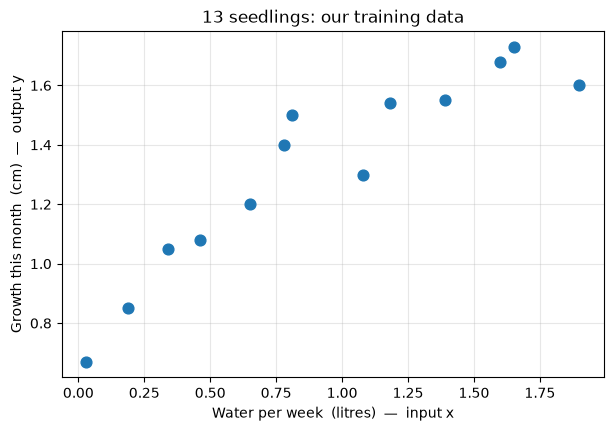

In [3]:
# Always look at your data first!
fig, ax = plt.subplots()
ax.scatter(x, y, color="tab:blue", s=60, zorder=3)
ax.set_xlabel("Water per week  (litres)  —  input x")
ax.set_ylabel("Growth this month  (cm)  —  output y")
ax.set_title("13 seedlings: our training data")
plt.show()

The dots are not on a perfect line — real measurements never are — but there is a
clear trend: **more water, more growth**. A straight line through the middle of
the cloud looks like it would describe the data pretty well.

So let's *make* the computer draw that line.

## 3. The model: a straight line

The simplest useful model is the equation of a straight line. You have seen it
in math class, maybe written as $y = mx + b$. We will call the two knobs $m$ and
$c$:

$$ y = m \, x + c $$

- **$m$ is the slope** — how steeply the line rises. Big $m$ = steep line
  (a little more water gives a lot more growth). $m = 0$ is a flat line.
- **$c$ is the intercept** — where the line crosses the $y$-axis, i.e. the
  predicted growth when $x = 0$.

$m$ and $c$ are the model's **parameters**. "Fitting the model" (or "training",
or "learning") just means: *find the values of $m$ and $c$ that make the line
match the data best.*

In [4]:
# The linear model: given inputs x and parameters (c, m), predict outputs
def linear_model(x, c, m):
    return m * x + c


# Example: a line with slope 0.5 and intercept 0.8, evaluated at x = 1.0
print("prediction at x = 1.0:", linear_model(1.0, c=0.8, m=0.5))

prediction at x = 1.0: 1.3


### Turning the knobs

Let's draw a few different lines on top of the data and eyeball them. Each line
is one choice of $(m, c)$ — one "guess" at the model.

In [5]:
# Helper: draw the data plus one straight line, and show its parameters
def plot_line(x, y, c, m, ax=None, title=None):
    if ax is None:
        fig, ax = plt.subplots()
    ax.scatter(x, y, color="tab:blue", s=45, zorder=3)
    x_line = np.linspace(0, 2, 100)
    ax.plot(x_line, linear_model(x_line, c, m), "r-", lw=2)
    ax.set_xlabel("Water, x")
    ax.set_ylabel("Growth, y")
    ax.set_xlim(0, 2)
    ax.set_ylim(0, 2)
    if title is None:
        title = f"m = {m:.2f},  c = {c:.2f}"
    ax.set_title(title)
    return ax

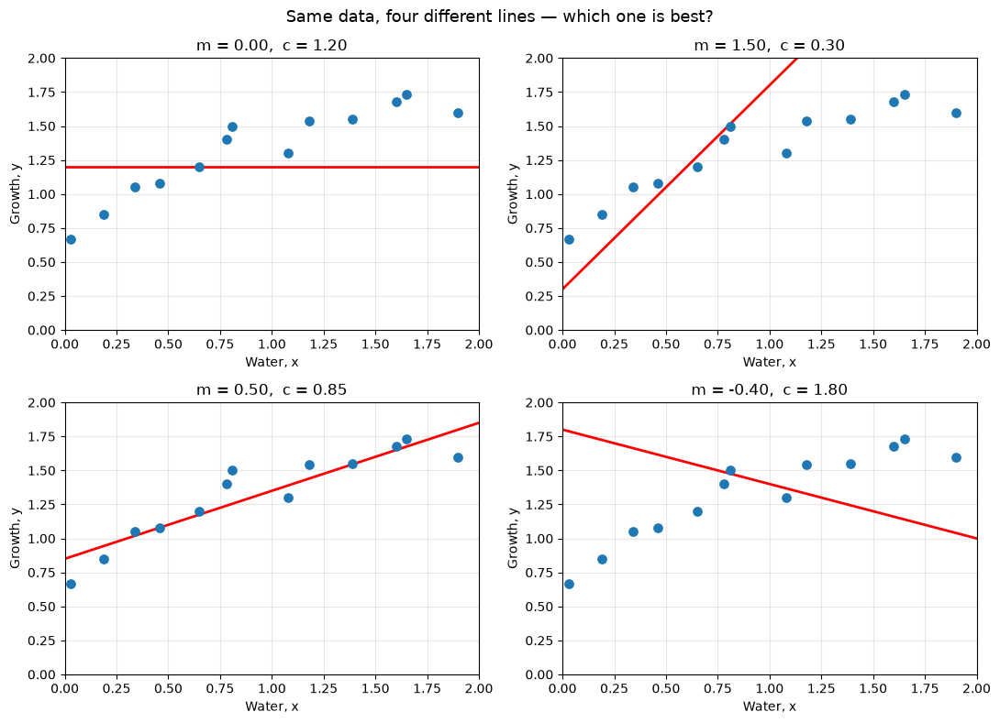

In [ ]:
# Four different guesses for (m, c)
guesses = [
    (0.0, 1.2),  # flat line: "water doesn't matter"
    (1.5, 0.3),  # too steep
    (0.5, 0.85),  # looks about right
    (-0.4, 1.8),  # wrong direction!
]

fig, axes = plt.subplots(2, 2, figsize=(11, 8))
for (m, c), ax in zip(guesses, axes.flat):
    plot_line(x, y, c, m, ax=ax)
fig.suptitle("Same data, four different lines — which one is best?", fontsize=13)
fig.tight_layout()
plt.show()

Your eye can rank these instantly: the bottom-left line is good, the others are
bad in different ways. But a computer has no eyes. We need to turn "good fit"
into **a number it can compute** — and then make that number as good as possible.

## 4. Scoring a line: the loss

For any single seedling, the model makes an error:

$$ \text{error}_i = y_i - (\text{prediction for } x_i) = y_i - (m\,x_i + c) $$

That is the vertical gap between a dot and the line. We want *all* those gaps to
be small. To combine them into one score we:

1. **Square** each error. This makes every term positive (so gaps above and
   below the line don't cancel out), and it punishes big misses much more than
   small ones.
2. Take the **mean** of the squared errors.

The result is called the **Mean Squared Error (MSE)**, and it is the model's
**loss**:

$$ \text{loss}(m, c) = \frac{1}{n}\sum_{i=1}^{n} \bigl(y_i - (m\,x_i + c)\bigr)^2 $$

**Small loss = good fit.** Learning is the hunt for the $(m, c)$ that makes the
loss as small as possible.

In [ ]:
# The loss: mean of the squared vertical gaps between the dots and the line
def compute_loss(x, y, c, m):
    predictions = linear_model(x, c, m)
    errors = y - predictions
    return np.mean(errors**2)

In [8]:
# Score each of our four guesses
print(f"{'m':>6} {'c':>6} {'loss':>10}")
print("-" * 24)
for m, c in guesses:
    print(f"{m:>6.2f} {c:>6.2f} {compute_loss(x, y, c, m):>10.4f}")

     m      c       loss
------------------------
  0.00   1.20     0.1146
  1.50   0.30     0.4731
  0.50   0.85     0.0151
 -0.40   1.80     0.2983


The numbers agree with our eyes: the line with `m = 0.5, c = 0.85` has by far
the smallest loss. The "wrong direction" line is the worst.

But we only checked four lines. There are infinitely many. **How do we find the
very best one?**

## 5. The loss landscape

Here is the trick that makes everything click. The loss depends on two numbers,
$m$ and $c$. So we can picture it as a **landscape**: stand at a location given
by $(c, m)$, and the *height* of the ground there is the loss.

- Flat, low regions = combinations of $m$ and $c$ that fit the data well.
- Steep, high regions = terrible fits.
- The **lowest point of the whole landscape** is the best possible line.

Let's compute the loss for a grid of *one million* $(c, m)$ combinations and
draw the landscape as a contour map — like the elevation lines on a hiking map.

In [9]:
# A grid of candidate values for each parameter
c_values = np.linspace(-5, 5, 1000)
m_values = np.linspace(-5, 5, 1000)

# Loss at every (c, m) combination on the grid  (1000 x 1000 = 1,000,000 lines)
loss_values = np.zeros((len(c_values), len(m_values)))
for i, c in enumerate(c_values):
    for j, m in enumerate(m_values):
        loss_values[i, j] = compute_loss(x, y, c, m)

# Brute-force search: which grid point has the smallest loss?
min_index = np.unravel_index(np.argmin(loss_values), loss_values.shape)
best_c = c_values[min_index[0]]
best_m = m_values[min_index[1]]
best_loss = loss_values[min_index]
print(f"Best line found: m = {best_m:.3f}, c = {best_c:.3f}")
print(f"Its loss: {best_loss:.5f}")

Best line found: m = 0.516, c = 0.846
Its loss: 0.01506


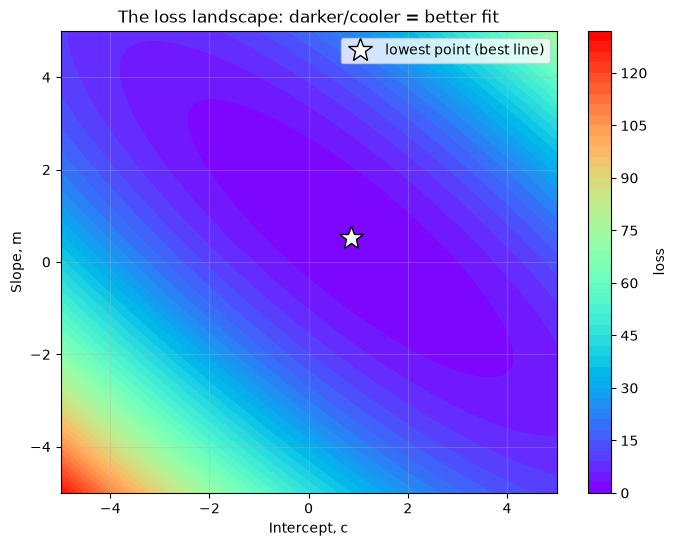

In [ ]:
# Draw the landscape as a contour map
C, M = np.meshgrid(c_values, m_values)

plt.figure(figsize=(8, 6))
contour = plt.contourf(C, M, loss_values.T, levels=50, cmap="rainbow")
plt.colorbar(contour, label="loss")
plt.plot(best_c, best_m, "w*", markersize=18, markeredgecolor="black", label="lowest point (best line)")
plt.xlabel("Intercept, c")
plt.ylabel("Slope, m")
plt.title("The loss landscape: darker/cooler = better fit")
plt.legend()
plt.show()

The landscape has a single **valley**, and the white star sits at its bottom.
Zooming in visually, the "bullseye" is centred near $c \approx 0.85$,
$m \approx 0.51$ — exactly the region our best eyeball guess was in.

We found the minimum by **brute force**: computing the loss a million times and
picking the smallest. That works here because there are only two parameters. A
real neural network can have *billions* of parameters — checking every
combination would take longer than the age of the universe. That is the problem
the next lesson solves.

First, let's see the winning line.

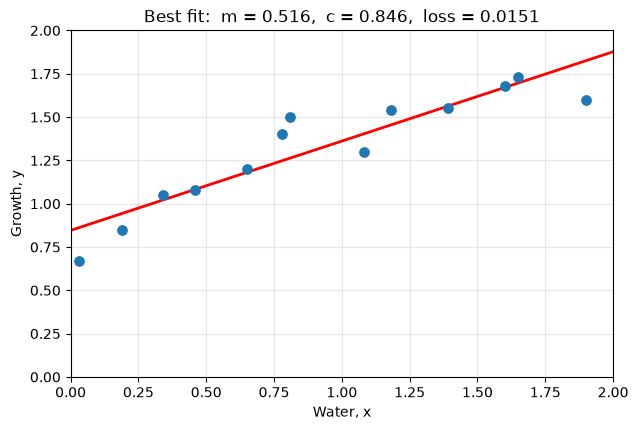

In [ ]:
# The best-fit line, drawn over the data
plot_line(x, y, best_c, best_m, title=f"Best fit:  m = {best_m:.3f},  c = {best_c:.3f},  loss = {best_loss:.4f}")
plt.show()

### The landscape in 3D

The contour map is the "view from above". Here is the same loss landscape as an
actual surface you can rotate and spin with your mouse. Look for the single
low point — the bottom of the bowl.

In [ ]:
import plotly.graph_objects as go

fig3d = go.Figure(data=[go.Surface(z=loss_values.T, x=c_values, y=m_values, colorscale="rainbow")])
fig3d.update_layout(
    title="Loss landscape (drag to rotate)",
    scene=dict(
        xaxis_title="Intercept, c",
        yaxis_title="Slope, m",
        zaxis_title="Loss",
    ),
    width=900,
    height=650,
)
fig3d.show()

## 6. So... what did the computer "learn"?

Look back at what we did, in Tom Mitchell's language:

- **Task T** — predict a seedling's growth from its watering amount.
- **Experience E** — the 13 measured seedlings.
- **Performance measure P** — the loss (smaller is better).
- **Learning** — searching through possible lines and keeping the one with the
  lowest loss.

Nobody told the computer that the slope should be about `0.5`. It **discovered**
that value by minimising the loss. That is the whole game. Every model in this
course — including deep neural networks — follows the same three-step recipe:

> **model → loss → minimise the loss**

What changes from here on is (a) the model gets more flexible than a straight
line, and (b) the search gets smarter than brute force. That smarter search is
**gradient descent**, and it is the subject of the next notebook.

## 7. Recap

- A **model** is a rule with adjustable **parameters**. Our model was the line
  $y = mx + c$, with parameters $m$ (slope) and $c$ (intercept).
- The **loss** is one number saying how wrong the model is. We used **Mean
  Squared Error**: average of the squared vertical gaps between data and line.
- The loss depends on the parameters, so it forms a **landscape**. The best
  model sits at the **lowest point**.
- **Learning = minimising the loss.** We did it by brute force (a million
  guesses). Real systems need something faster.

## 8. Your turn — experiments

Try these in the empty cell below. Re-run the relevant cells above as needed.

1. **Beat the eyeball.** Pick your own `(m, c)` and call
   `compute_loss(x, y, c, m)`. Our best guess above scored `0.0151` — can you
   beat it by hand and get close to the brute-force best of `0.01506`?
2. **Why squared?** Change `compute_loss` to use `np.abs(errors)` instead of
   `errors ** 2` (this is the *Mean Absolute Error*). Does the best-fit line
   change much? Which one is more upset by a single weird data point?
3. **A finer grid.** In the landscape cell, change `np.linspace(-5, 5, 1000)` to
   `np.linspace(-2, 3, 1500)` for both parameters. Does the reported best
   `(m, c)` get closer to the true best fit? How much slower is it?
4. **Add an outlier.** Append one strange seedling to `x` and `y` (say
   `x = 1.0`, `y = 5.0`) and refit. How far does the line move?
5. **A curve instead of a line.** What if growth flattens out at high water?
   Sketch (on paper) what the loss landscape might look like if the model were
   $y = a\sqrt{x} + c$ instead. How many parameters now?

In [13]:
# Space for your experiments